In [1]:
from collections import defaultdict
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools
import seaborn as sns
import scvelo as scv
#import velocyto as vcy
from os import listdir
from os.path import isfile, join
import glob
from collections import Counter
import loompy as lp
import numba
import llvmlite

# import mnnpy
from matplotlib import colors

In [2]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0.2, 1, 140))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,10))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [3]:
scv.set_figure_params('scanpy')  # for beautified visualization

## day30

In [10]:
d30_final_adata = '../count_matrix/cellranger_final_d30_adata.h5ad'

In [11]:
adata = sc.read_h5ad(d30_final_adata)

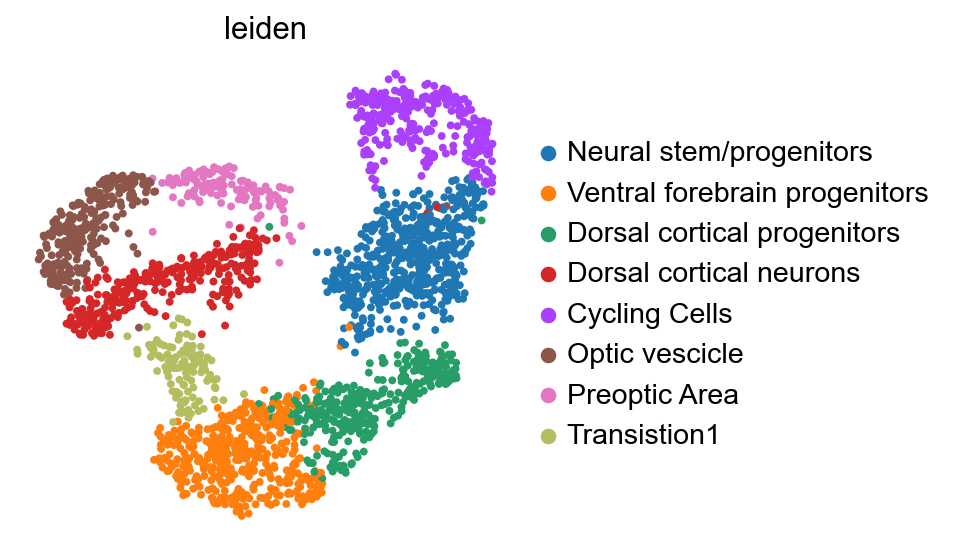

In [53]:
sc.pl.umap(adata, color=['leiden'], frameon=False)


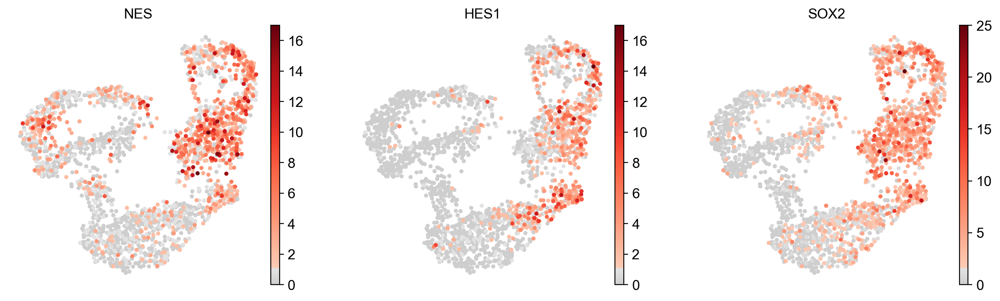

In [14]:
# Neuronal stem cells and progenitors markers

sc.pl.umap(adata,
           color = ['NES', 'HES1', 'SOX2'],
           color_map = mymap,
           frameon = False,
           use_raw=True,
          )



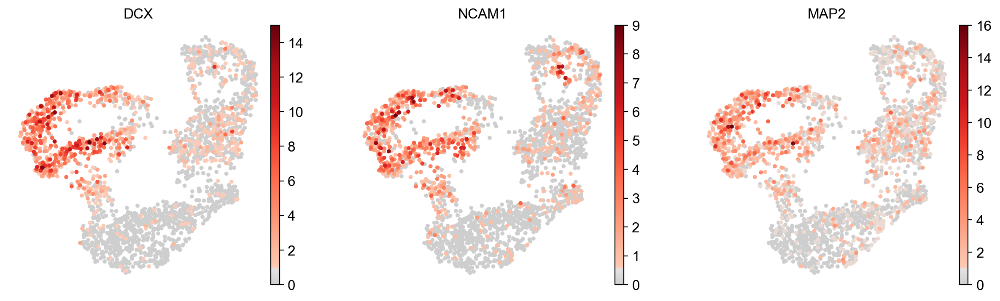

In [15]:
# Neuronal marker

sc.pl.umap(adata,
           color = ['DCX', 'NCAM1','MAP2'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

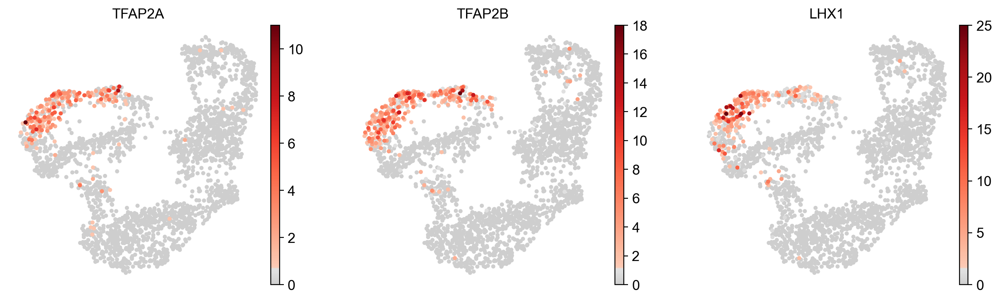

In [16]:
# Optic area markers

sc.pl.umap(adata,
           color = ['TFAP2A', 'TFAP2B','LHX1'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

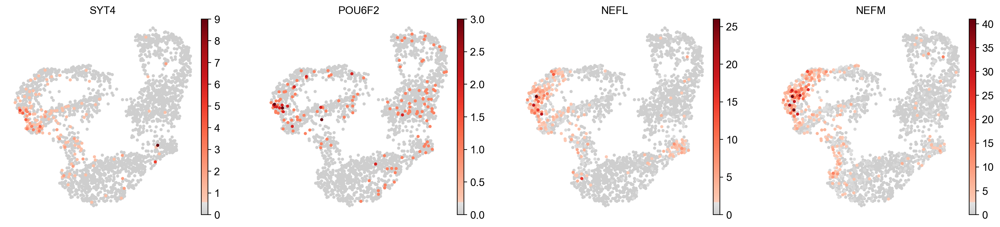

In [17]:
# Retinal Ganglion Cell markers

sc.pl.umap(adata,
           color = ['SYT4', 'POU6F2','NEFL', 'NEFM'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

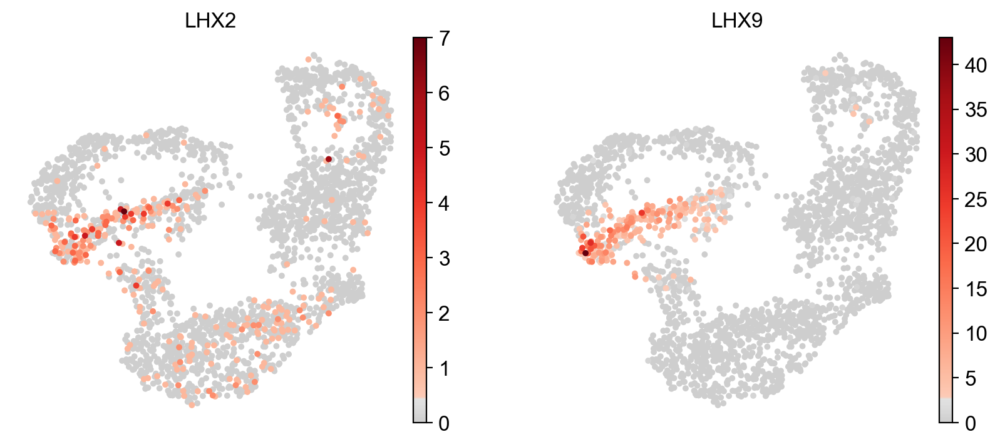

In [18]:
# Dorsal cortical neurons

sc.pl.umap(adata,
           color = ['LHX2', 'LHX9'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

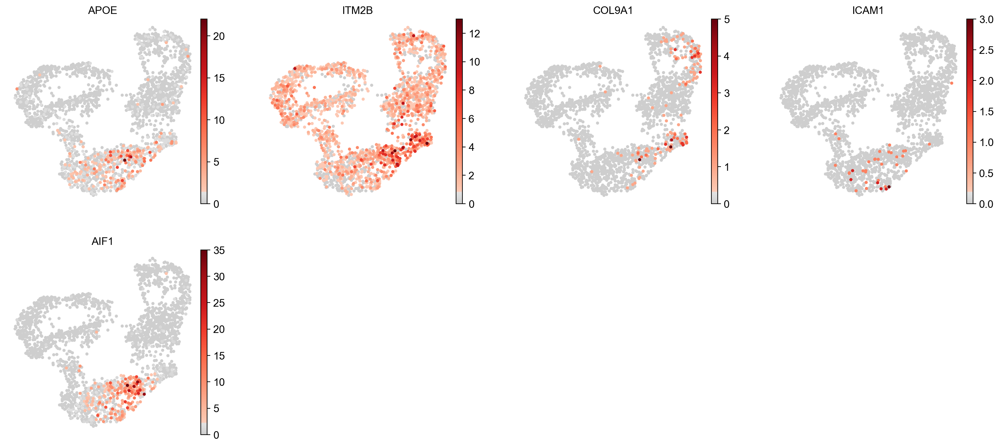

In [19]:
# Muller Glia and Microglia markers

sc.pl.umap(adata,
           color = ['APOE', 'ITM2B','COL9A1', 'ICAM1','AIF1'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

In [ ]:
# Cell cycle marker

sc.pl.umap(adata,
           color = ['AURKB'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

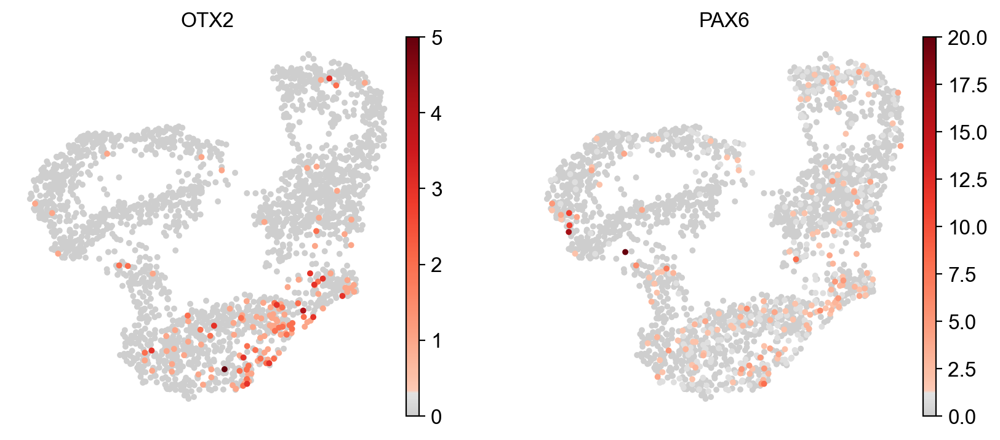

In [20]:
# Anterior neuronal tube

sc.pl.umap(adata,
           color = ['OTX2', 'PAX6'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

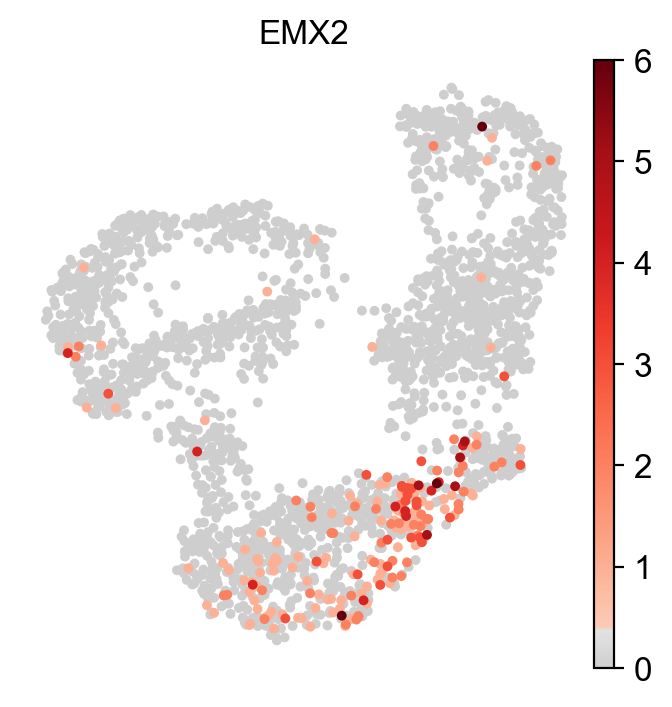

In [21]:
# Dorsal progenitors

sc.pl.umap(adata,
           color = ['EMX2'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

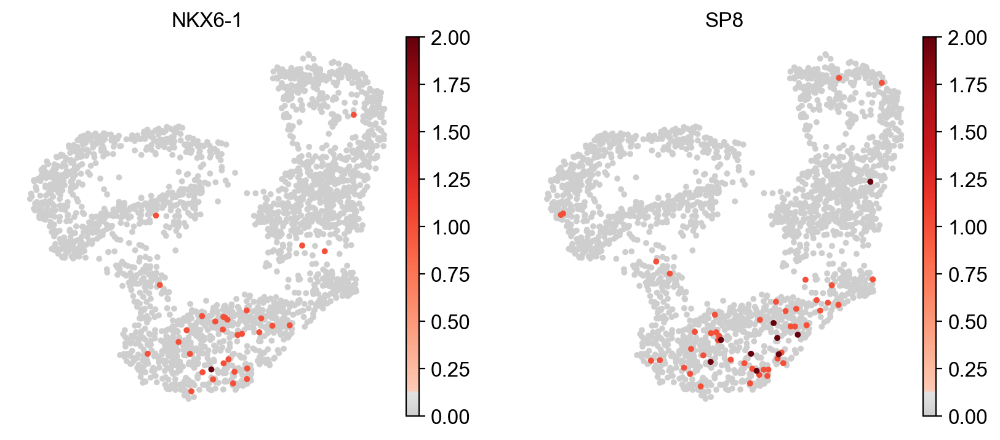

In [23]:
# Ventral forebrain progenitors 

sc.pl.umap(adata,
           color = ['NKX6-1', 'SP8'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

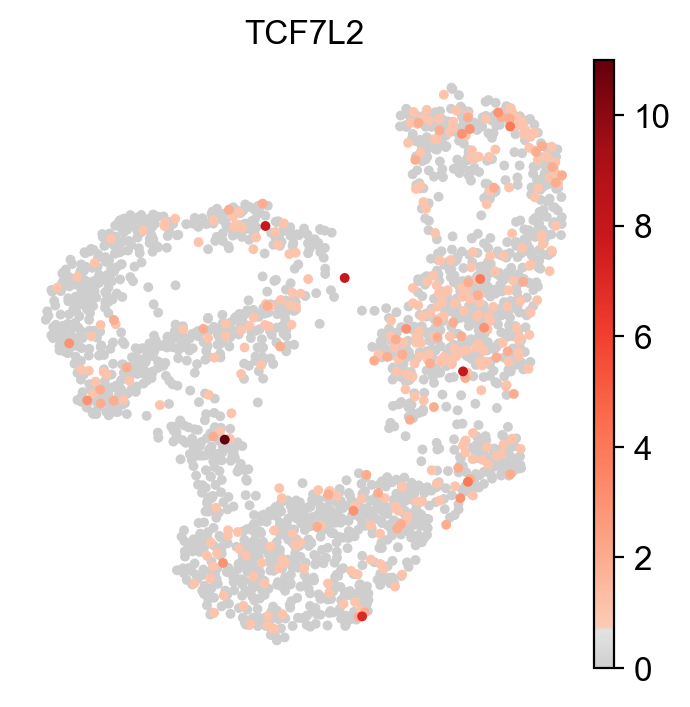

In [22]:
# Diencephalon

sc.pl.umap(adata,
           color = ['TCF7L2'],
           color_map = mymap,
           frameon = False,
           use_raw=True
          )

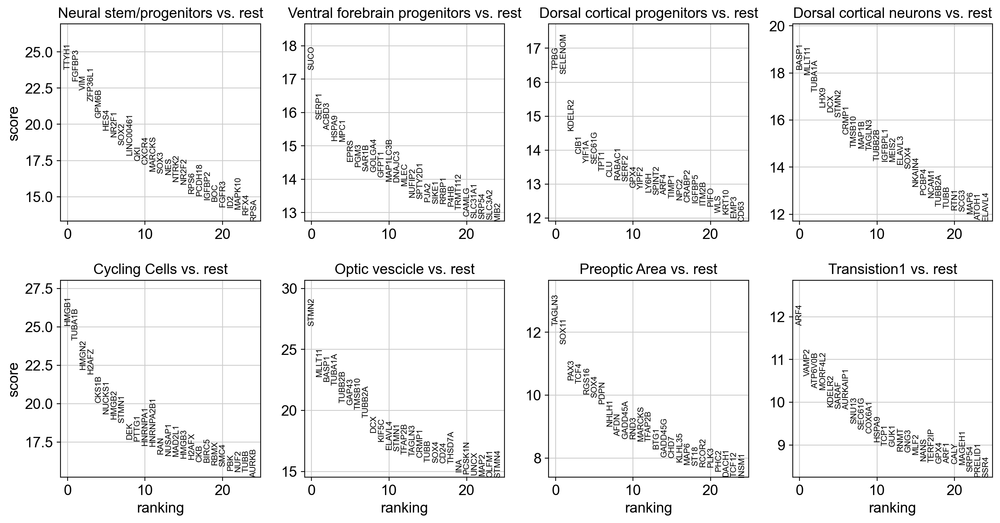

In [29]:
# Find marker genes
sc.settings.set_figure_params(dpi=100)

sc.tl.rank_genes_groups(adata, 'leiden', method='t-test', key_added='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='t-test')
sc.settings.set_figure_params(dpi=80)

In [30]:
result = adata.uns['t-test']
groups = result['names'].dtype.names

In [31]:
tab_result=pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']})

In [32]:
sc.tl.dendrogram(adata,groupby='leiden')

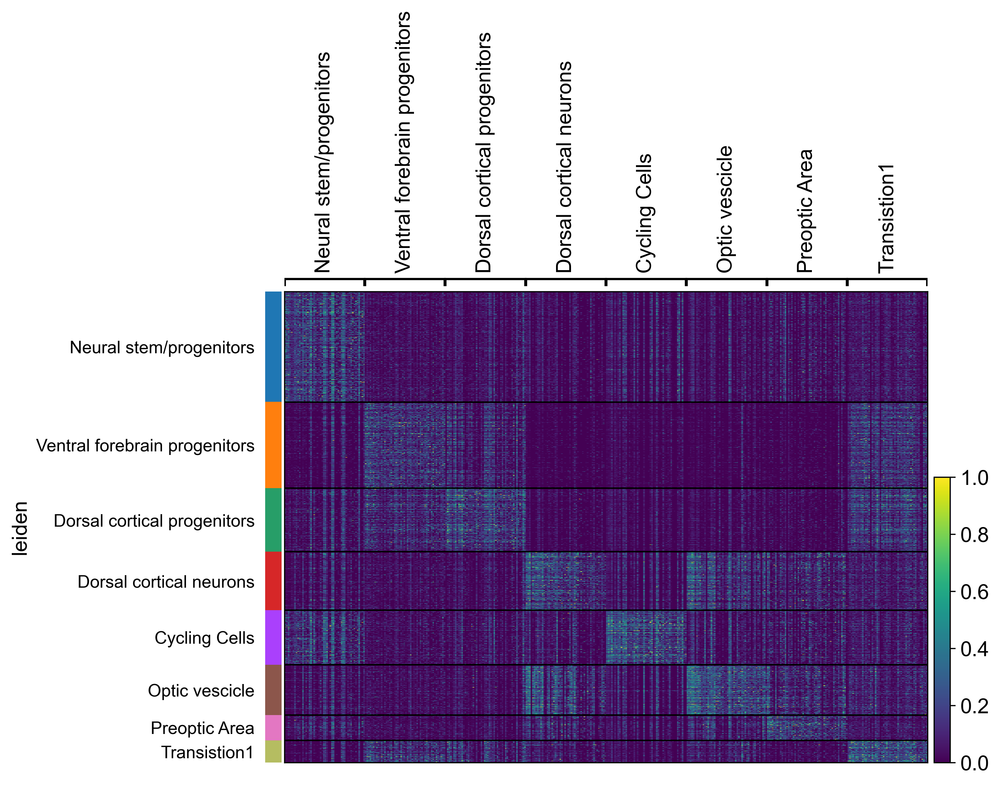

In [33]:
sc.settings.set_figure_params(dpi=150)


sc.pl.rank_genes_groups_heatmap(adata,
                                use_raw=True,
                                groupby='leiden',
                                key='t-test',
                                n_genes=50,
                                standard_scale='var',
                                cmap='viridis',
#                                 show_gene_labels=True,
                                dendrogram=False, save='heatmap.pdf')

sc.settings.set_figure_params(dpi=150)



In [34]:
Patterning_marker_dict = {
'Forebrain': ['LHX2', 'LHX9', 'PAX6', 'EMX2', 'OTX2'],
'Midbrain': ['FOXA2', 'PITX3'],
'Hindbrain': ['GBX2'],
'Endoderm': ['SOX17'],
'Ectoderm': ['PAX2'],
'Neural crest': ['SOX10', 'FOXD3'], # , 'CDH1', 'CDH2'
'Non-neuronal epithelial': ['CDH1'], 
'Neuronal epithelial': ['CDH2'],
'HOX': ['HOXA1', 'HOXA2', 'HOXA3', 'HOXA7','HOXB2', 'HOXB7', 'HOXB9','HOXC9', 'HOXC13','HOXD8','HOXD13'],
}

categories: Neural stem/progenitors, Ventral forebrain progenitors, Dorsal cortical progenitors, etc.
var_group_labels: Forebrain, Midbrain, Hindbrain, etc.


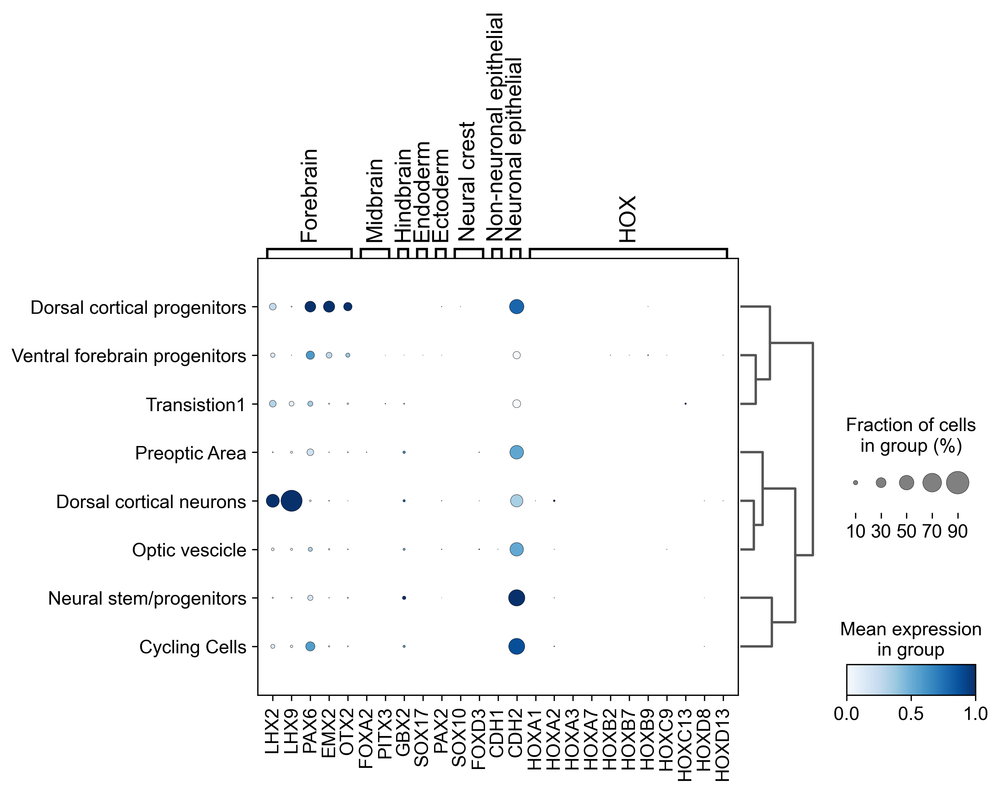

In [35]:
ax = sc.pl.dotplot(adata, Patterning_marker_dict, groupby='leiden', dendrogram=True,
                   standard_scale='var', smallest_dot=40, color_map='Blues', figsize=(8,5), save='Patterning_markers.pdf')

**Pseudotime**

In [37]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['leiden']  == 'Neural stem/progenitors')[0]


In [38]:
sc.tl.dpt(adata)

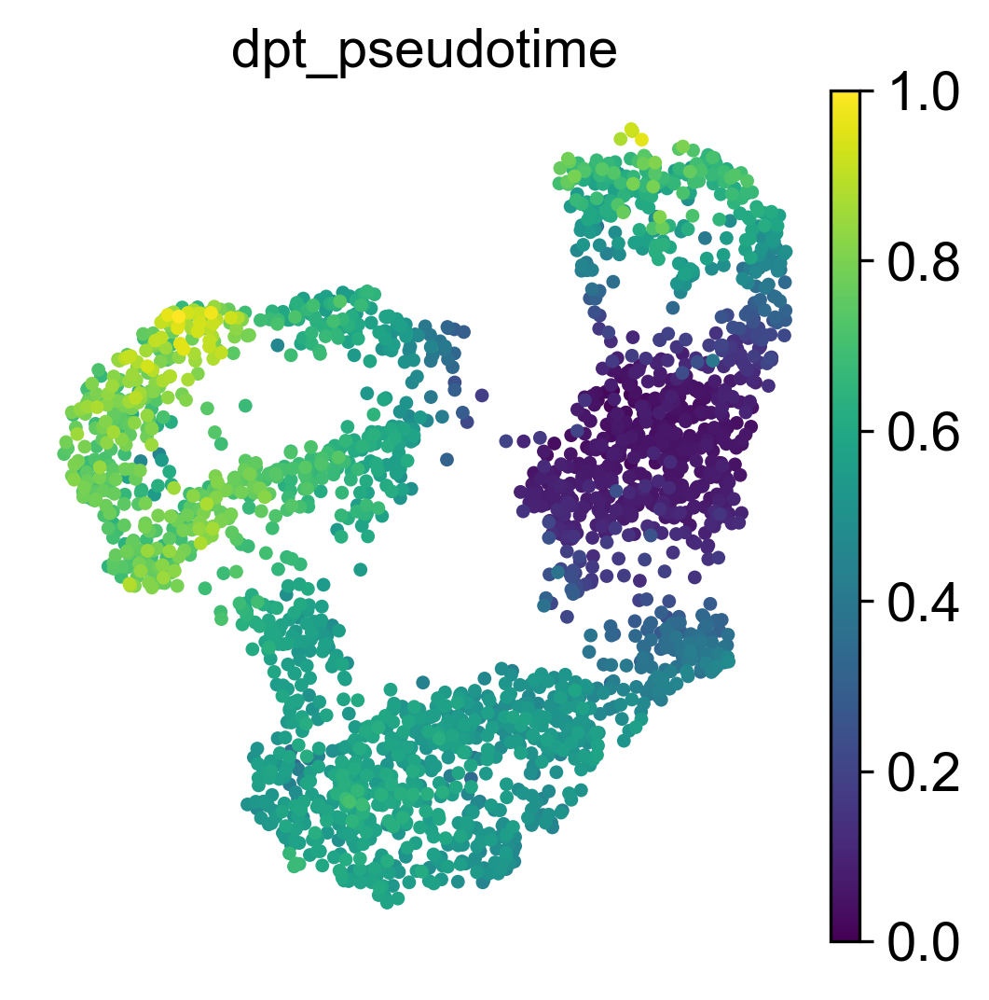

In [39]:
sc.pl.umap(adata, color=['dpt_pseudotime'], frameon=False)


In [48]:
# Subset cells to only progenitors, pre-optic and optic vescicle clusters

subset_cells=adata.obs["leiden"].str.contains(('^Neural stem/progenitors$|^Preoptic Area$|^Optic vescicle$'), regex=True)


In [49]:
subset = adata[subset_cells,:]

In [50]:
subset.uns['iroot'] = np.flatnonzero(subset.obs['leiden']  == 'Neural stem/progenitors')[0]


Trying to set attribute `.uns` of view, copying.


In [51]:
sc.tl.dpt(subset)

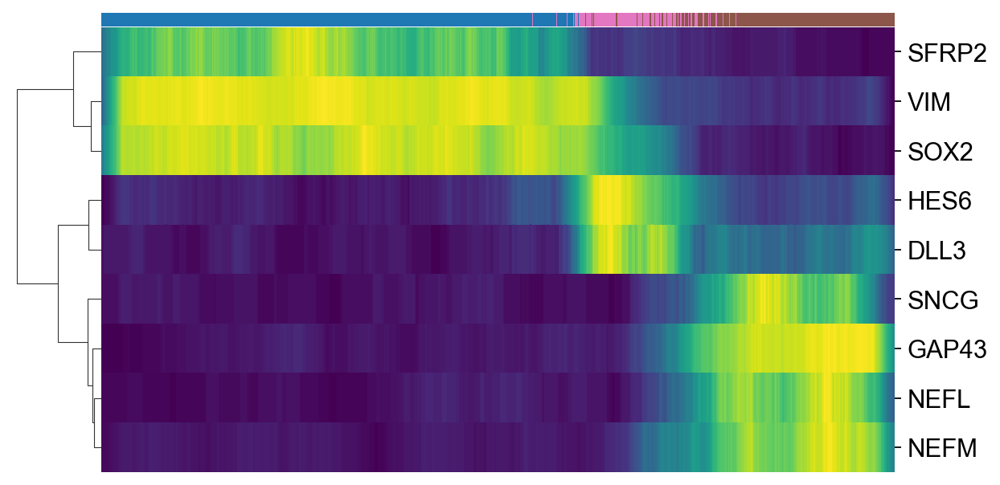

In [52]:
sc.settings.set_figure_params(dpi=80)

scv.pl.heatmap(adata[subset_cells,:], var_names=['VIM','SOX2','SFRP2','DLL3','HES6','GAP43','NEFM','NEFL','SNCG'],
               sortby='dpt_pseudotime',
               col_color='leiden',
               n_convolve=50,
               row_cluster=True,
#                save='pseudotime_RGCs.pdf',
#                dpi=300
              )

sc.settings.set_figure_params(dpi=80)


## day60

In [111]:
d60_final_adata = '../count_matrix/cellranger_final_d60_adata.h5ad'

In [112]:
adata = sc.read_h5ad(d60_final_adata)

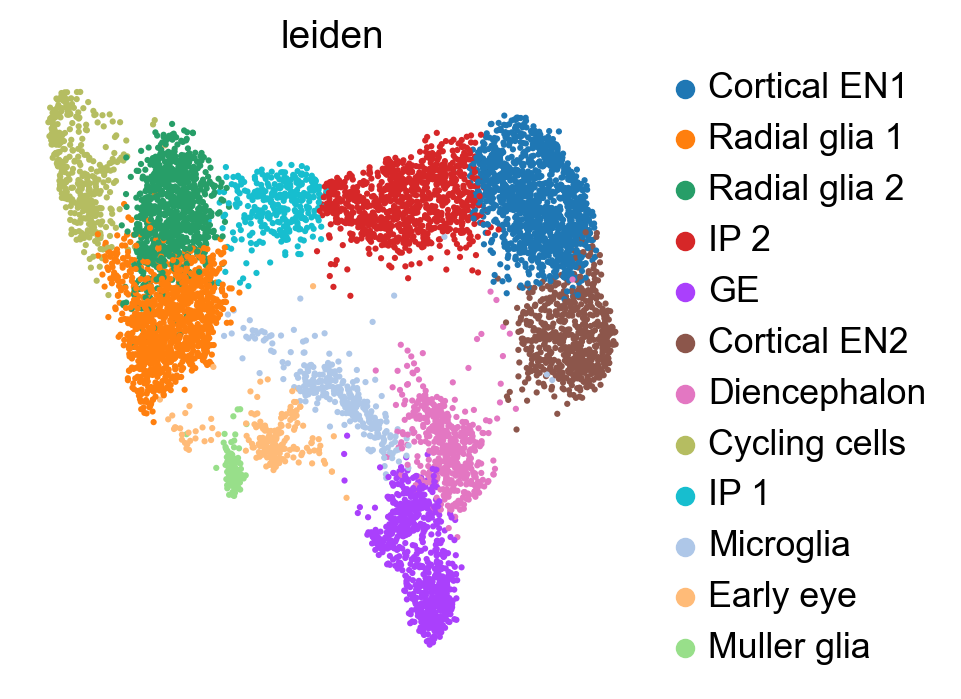

In [113]:
sc.pl.umap(adata, color=['leiden'], size=20, frameon = False)

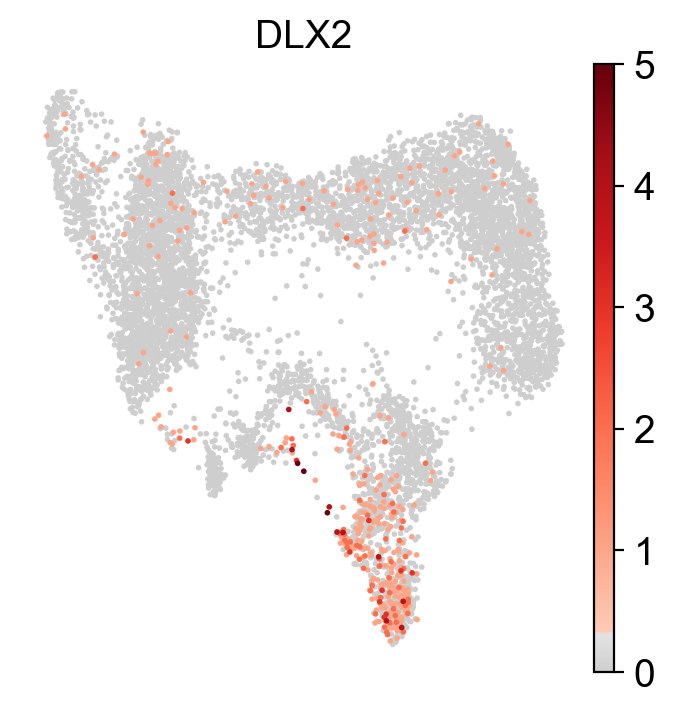

In [114]:
# GE
sc.pl.umap(adata, color=['DLX2'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

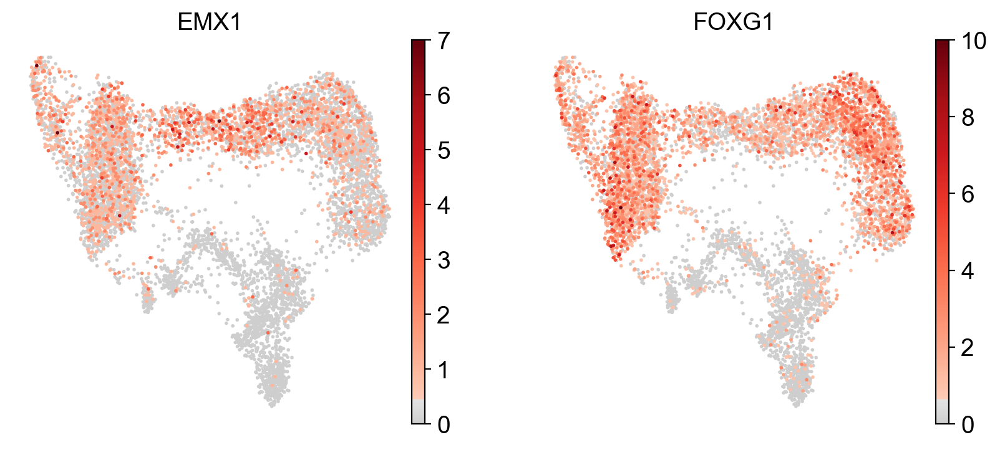

In [115]:
# Telencephalon
sc.pl.umap(adata, color=['EMX1','FOXG1'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

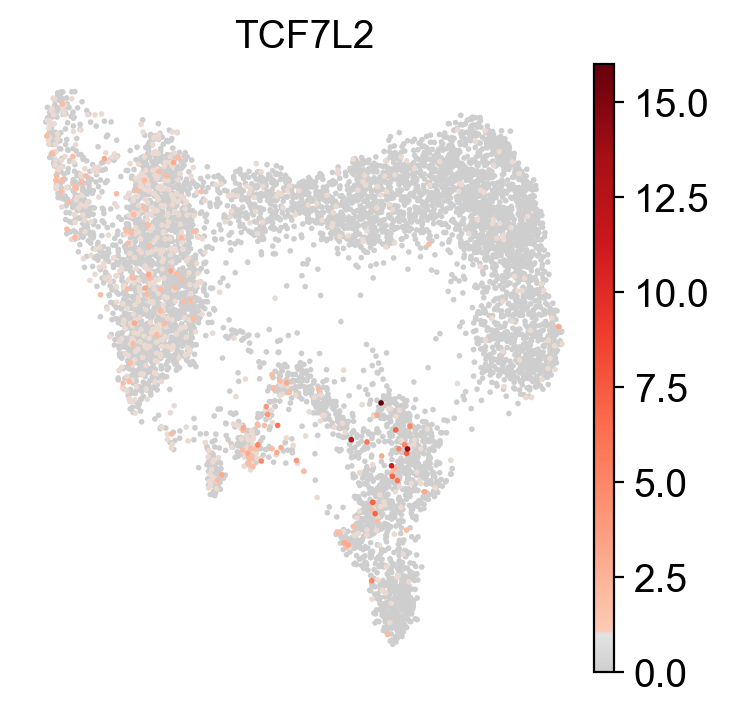

In [116]:
# Diencephalon
sc.pl.umap(adata, color=['TCF7L2'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

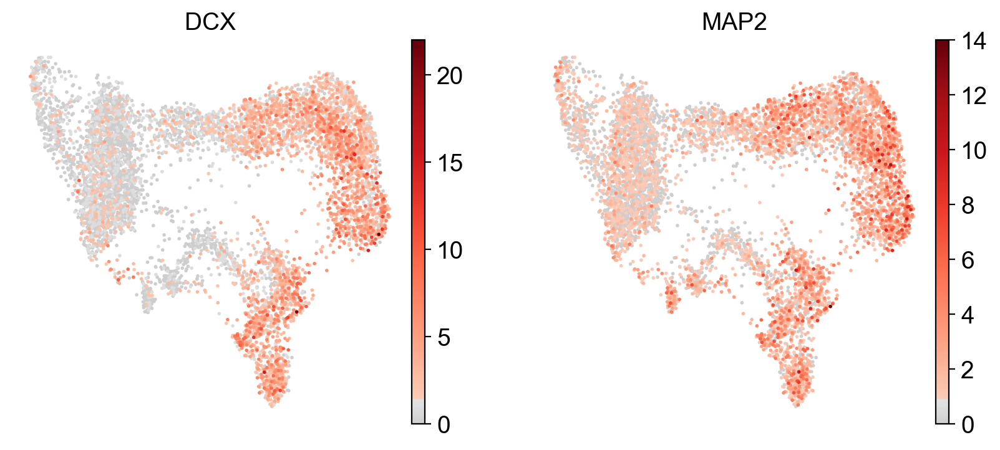

In [117]:
# Neuronal
sc.pl.umap(adata, color=['DCX', 'MAP2'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

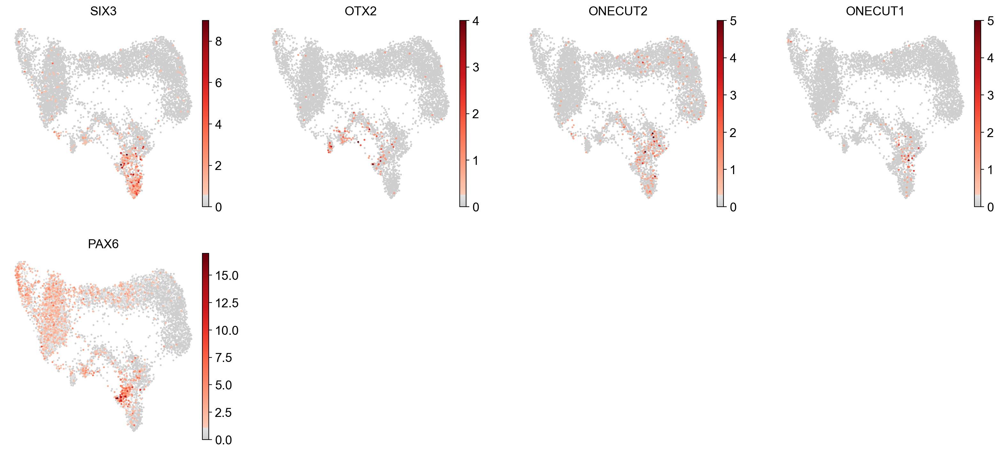

In [118]:
# Early eye development
sc.pl.umap(adata, color=['SIX3','OTX2', 'ONECUT2','ONECUT1', 'PAX6'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

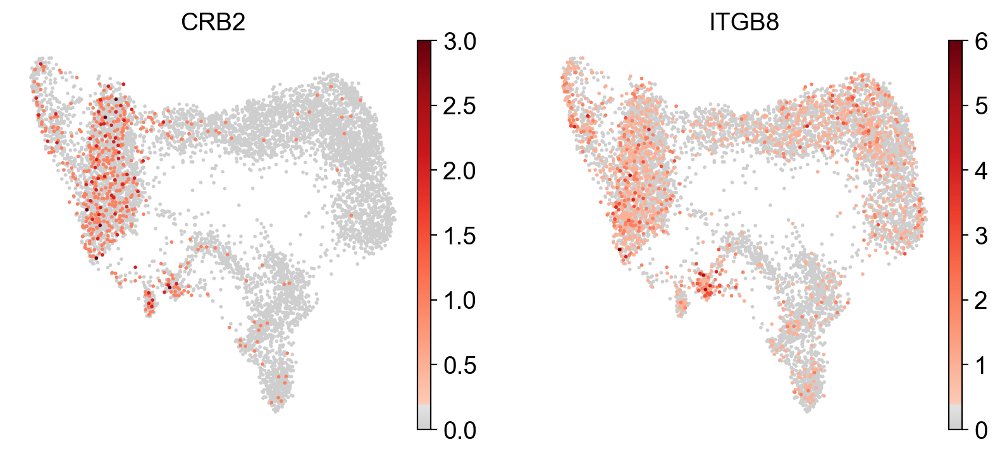

In [119]:
# Outer limiting membrane
sc.pl.umap(adata, color=['CRB2', 'ITGB8'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

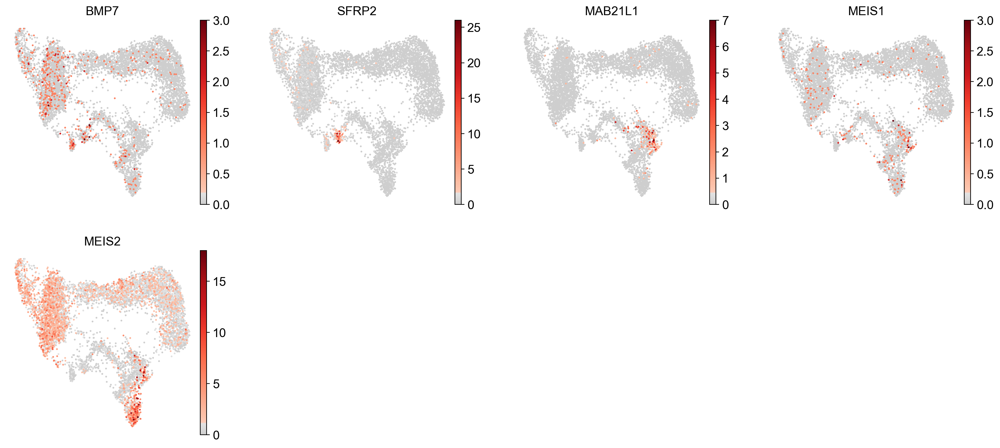

In [120]:
# Preplacodal lens ectoderm cells
sc.pl.umap(adata, color=['BMP7','SFRP2','MAB21L1','MEIS1','MEIS2'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

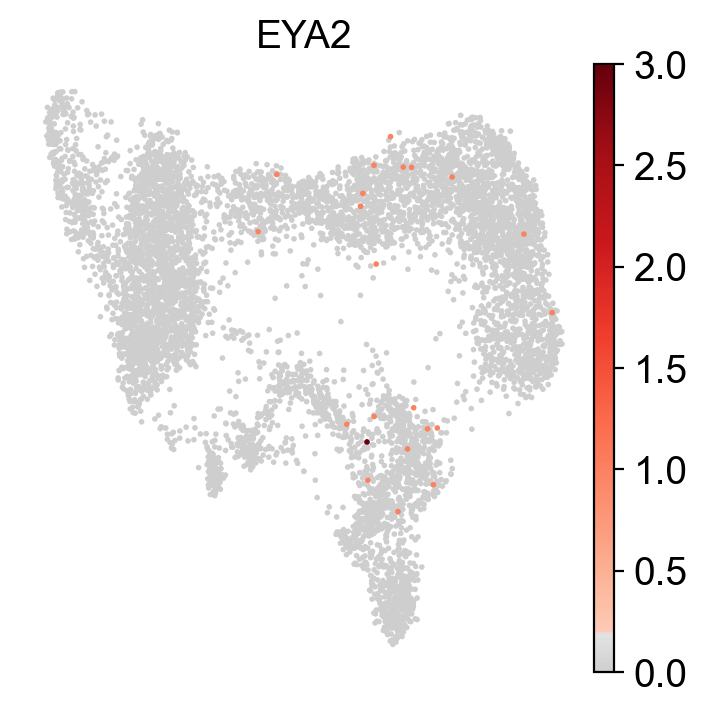

In [121]:
# Preplacodal ectoderm
sc.pl.umap(adata, color=['EYA2'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

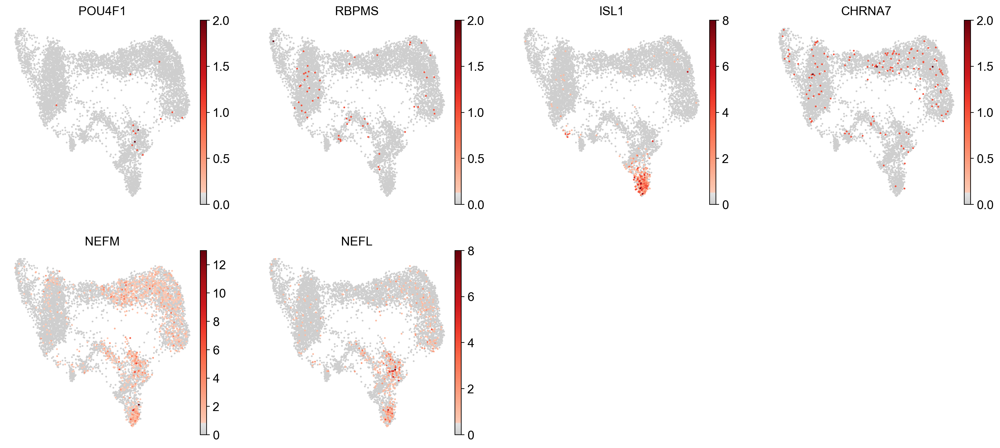

In [122]:
# Retinal Ganglion cells

sc.pl.umap(adata, color=['POU4F1','RBPMS','ISL1','CHRNA7','NEFM','NEFL'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

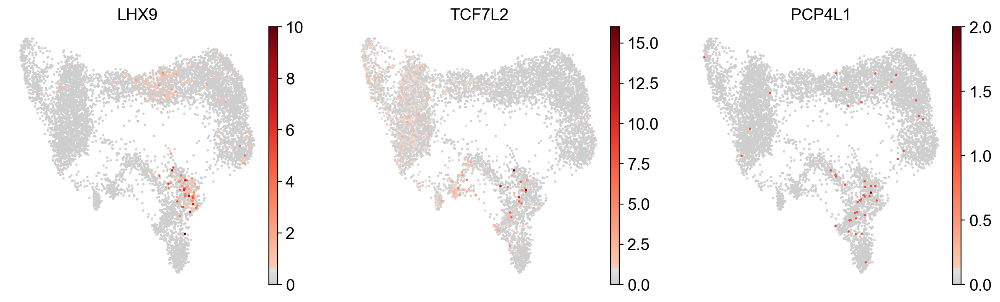

In [123]:
# Lateral Geniculate Nucleus (LGN)
sc.pl.umap(adata, color=['LHX9','TCF7L2','PCP4L1'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

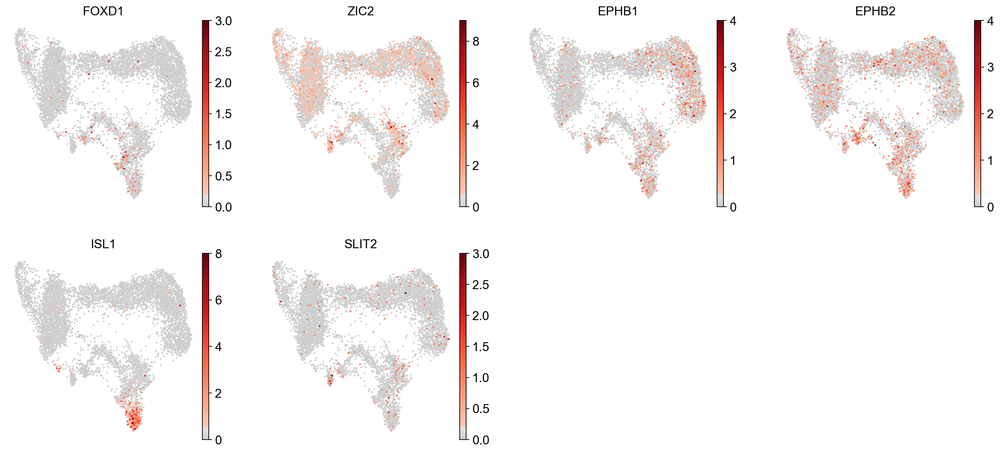

In [124]:
# Optic chiasm
sc.pl.umap(adata, color=['FOXD1','ZIC2','EPHB1','EPHB2','ISL1','SLIT2'],
           color_map=mymap,
           legend_fontsize='xx-large',
           frameon=False,
          )

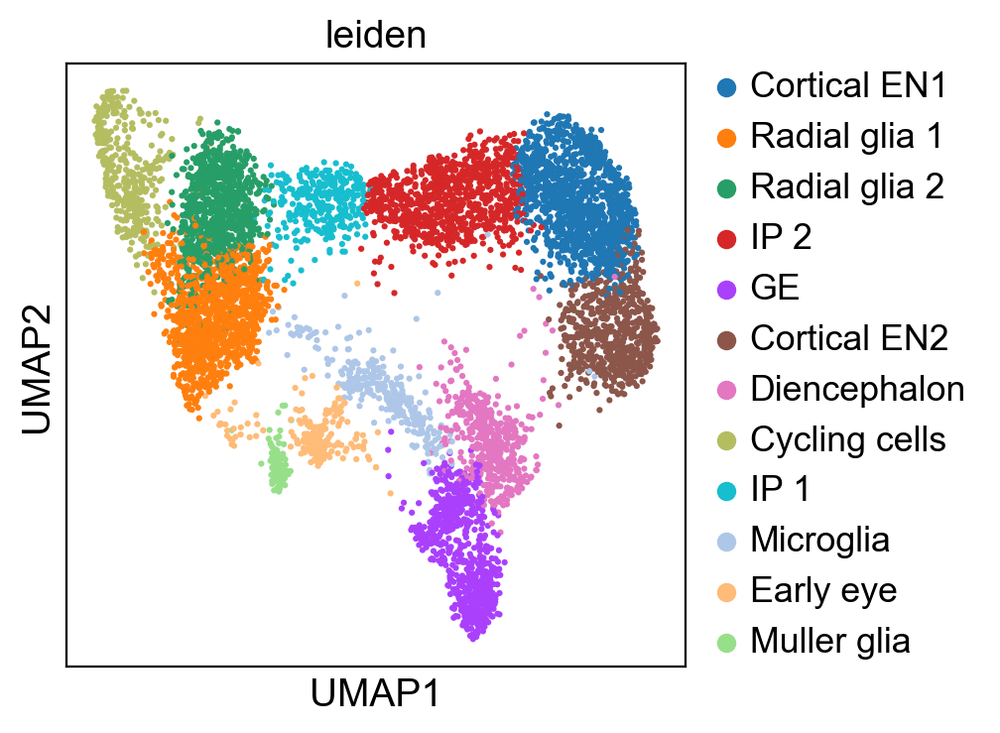

In [125]:
sc.settings.set_figure_params(dpi=100)

sc.pl.umap(adata, color=['leiden'], size=20)

sc.settings.set_figure_params(dpi=80)

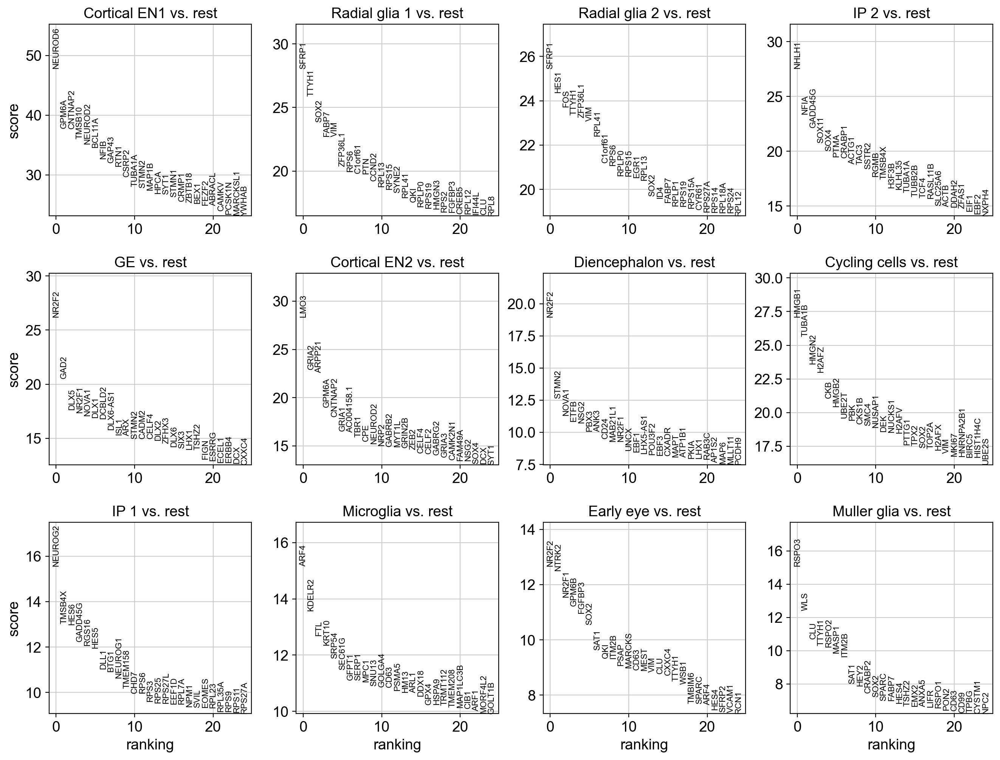

In [126]:
# Find marker genes
sc.settings.set_figure_params(dpi=100)

sc.tl.rank_genes_groups(adata, 'leiden', method='t-test_overestim_var', key_added='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='t-test')
sc.settings.set_figure_params(dpi=80)

In [127]:
result = adata.uns['t-test']
groups = result['names'].dtype.names

In [128]:
tab_result=pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']})

In [129]:
tab_result

,Cortical EN1_n,Cortical EN1_s,Radial glia 1_n,Radial glia 1_s,Radial glia 2_n,Radial glia 2_s,IP 2_n,IP 2_s,GE_n,GE_s,...,Cycling cells_n,Cycling cells_s,IP 1_n,IP 1_s,Microglia_n,Microglia_s,Early eye_n,Early eye_s,Muller glia_n,Muller glia_s
0,NEUROD6,47.810810,SFRP1,28.066210,SFRP1,25.451811,NHLH1,27.550993,NR2F2,26.165834,...,HMGB1,27.064047,NEUROG2,15.552437,ARF4,15.156133,NR2F2,12.658462,RSPO3,15.067739
1,GPM6A,37.775597,TTYH1,25.900043,HES1,24.355150,NFIA,23.356215,GAD2,20.520306,...,TUBA1B,25.656969,TMSB4X,13.024545,KDELR2,13.572112,NTRK2,12.492631,WLS,12.407526
2,CNTNAP2,37.743629,SOX2,23.873301,FOS,23.714375,GADD45G,22.165888,DLX5,17.634756,...,HMGN2,23.586767,HES6,12.978390,FTL,12.683821,NR2F1,11.542056,CLU,10.721018
3,TMSB10,36.007839,FABP7,22.720032,TTYH1,23.357649,SOX11,20.793024,NR2F1,17.364626,...,H2AFZ,22.993132,GADD45G,12.241394,KRT10,12.347772,GPM6B,11.224050,TTYH1,10.296886
4,NEUROD2,35.136238,VIM,22.709583,ZFP36L1,23.230618,SOX4,20.045782,NOVA1,17.060894,...,CKB,21.085333,RGS16,12.056541,SRP54,11.894684,FGFBP3,10.955892,RSPO2,10.203897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21422,CLU,-20.652029,GPM6A,-25.519167,SOX4,-20.774593,ZFP36L1,-15.878307,LINC01551,-20.382353,...,RTN1,-11.718589,RTN1,-10.620056,ACTB,-13.003180,NRXN1,-7.562852,SOX4,-7.172039
21423,TTYH1,-20.696472,STMN1,-25.596125,GPM6A,-21.548286,QKI,-16.583759,RPL13,-20.446419,...,SEZ6L2,-12.108478,GAP43,-11.531638,TUBB2B,-13.509545,BASP1,-8.023368,LINC01551,-7.770741
21424,ZFP36L1,-21.086031,TMSB10,-28.308168,STMN1,-22.120258,SOX2,-17.486788,RPL41,-21.091311,...,GAP43,-12.256609,TUBA1A,-11.966434,H3F3A,-14.212967,STMN2,-8.424154,STMN2,-8.030068
21425,MARCKS,-21.410746,STMN2,-28.604725,TMSB10,-22.521944,TTYH1,-18.360403,RPS2,-21.220686,...,GPM6A,-12.976750,TUBB2A,-13.054755,SOX4,-14.826276,PTMA,-8.684896,PTMA,-8.080564


In [130]:
sc.tl.dendrogram(adata,groupby='leiden')

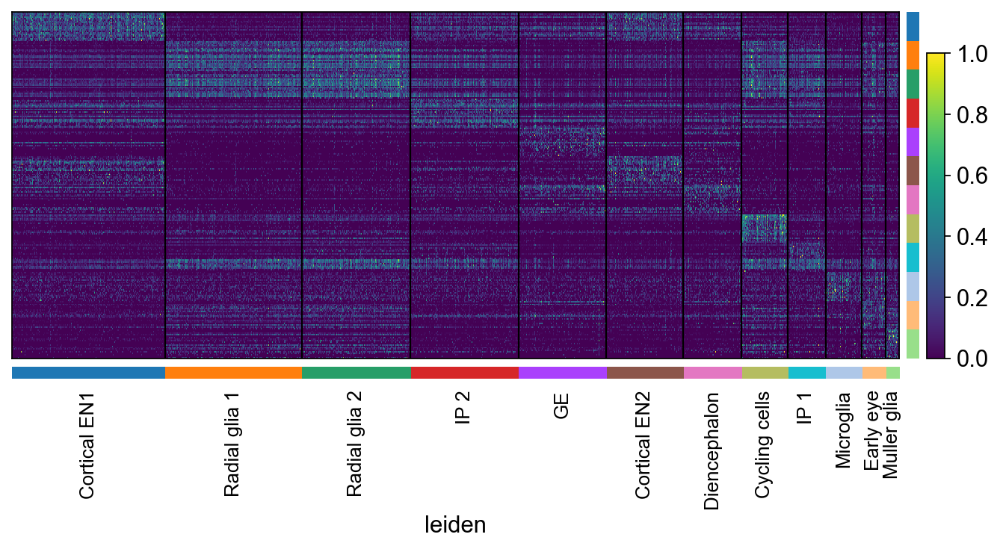

In [131]:
sc.pl.rank_genes_groups_heatmap(adata,
                                use_raw=True,
                                groupby='leiden',
                                key='t-test',
                                n_genes=20,
                                standard_scale='var',
                                cmap='viridis',
                                swap_axes=True,
                                dendrogram=False, 
                               )


In [133]:
Kanton_marker_dict = {'Cortical-EN' : ['MAP2','ENO2','FOXG1','NEUROD6','NEUROD2','SLC17A7'],
                       'GE-IN' : ['DLX5','DLX2','DLX1','GAD1','GAD2','SLC32A1','ISL1'],
                       'Diencefalon-EN' : ['EBF1','NHLH2', 'SLC17A6','LHX9','TFAP2B'],
                       'EarlyEye' : ['SIX3','OTX2','ONECUT2','ONECUT1'],
                       'RGCs' : ['NEFL'],
                       'RadialGlia' : ['NES', 'HES1', 'SOX2'],
                       'Microglia' : ['AIF1'],
                       'Lens' : ['CRYAB','KRT10','SPRY1','SPRY2'],
                       'CellCycle' : ['AURKB']
                      }

categories: Cortical EN1, Radial glia 1, Radial glia 2, etc.
var_group_labels: Cortical-EN, GE-IN, Diencefalon-EN, etc.


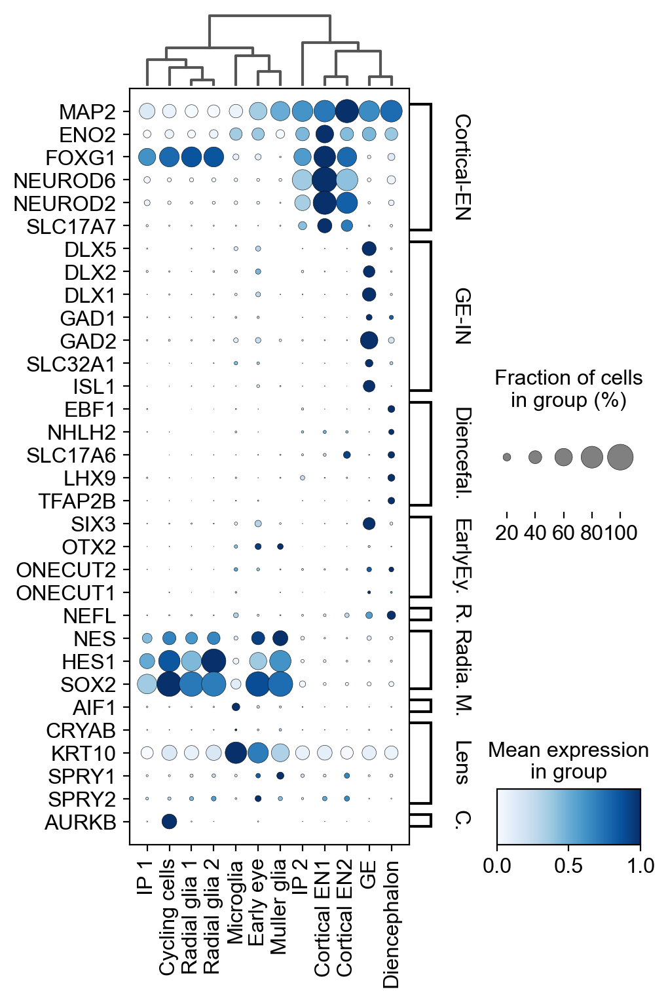

In [134]:
sc.settings.set_figure_params(dpi=100)

ax = sc.pl.dotplot(adata,
                   Kanton_marker_dict,
                   groupby='leiden',
                   #dendrogram=True,
                   standard_scale='var',
                   smallest_dot=40,
                   dendrogram=True,
                   swap_axes=True,
                   var_group_rotation=90,
                   color_map='Blues',
                   figsize=(5,8))

**Subset to optic-related clusters**

In [97]:
                                            #^4$|^6$|
optic_cells=adata.obs["leiden"].str.contains(('^Muller glia$|^Early eye$|^Microglia$|^Diencephalon$|^GE$'), regex=True)


In [98]:
optic = adata[optic_cells,:]

In [100]:
sc.tl.leiden(optic,resolution=0.6)

Trying to set attribute `.obs` of view, copying.


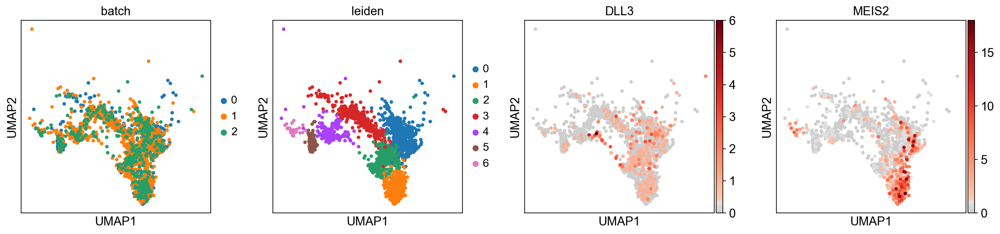

In [102]:
sc.pl.umap(optic, color=['batch','leiden'],
           use_raw=True,
           color_map=mymap)

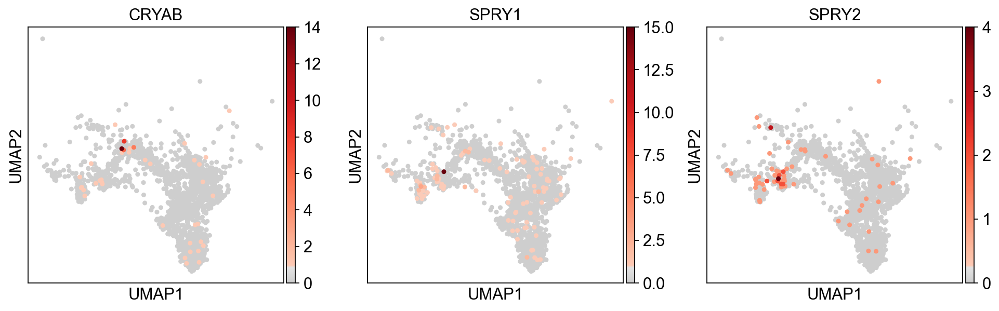

In [103]:
# Lens
sc.pl.umap(optic, color=['CRYAB','SPRY1','SPRY2'], color_map=mymap)

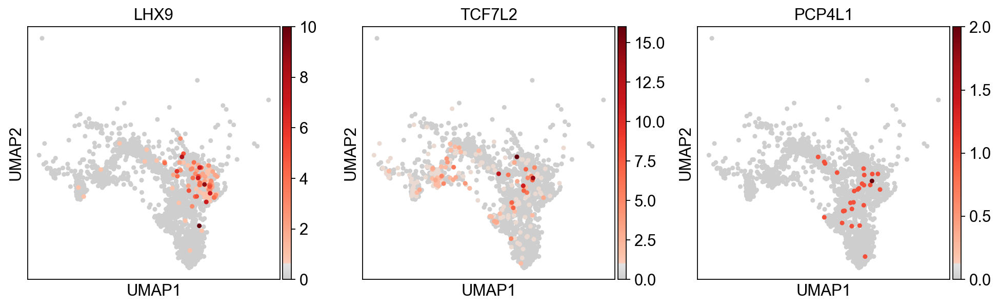

In [104]:
# LGN
sc.pl.umap(optic, color=['LHX9','TCF7L2','PCP4L1'], color_map=mymap)

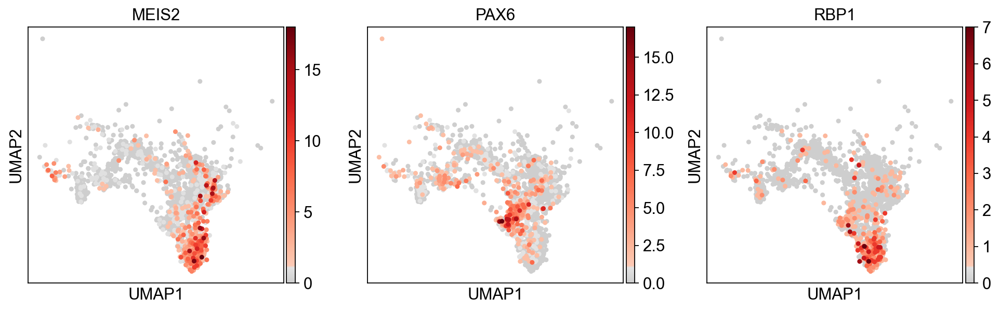

In [105]:
# Retina Dev
sc.pl.umap(optic, color=['MEIS2','PAX6','RBP1'], color_map=mymap)

In [71]:
# Keratin
# sc.pl.umap(optic, color=['KRT5',], color_map=mymap)

In [106]:
lens_marker_genes = {
                        'Lens' : ['CRYAB','KRT10','SPRY1','SPRY2'],
                        'Optic Chiasm' : ['ZIC2','SLIT2','EPHB2','FOXD1'],
                        'eyeDev' : ['OTX2','ONECUT2','ONECUT1','SIX3',],
                        'retDev'  : ['PAX6','MEIS2'],
                        'LGN'  : ['LHX9','PCP4L1'],
                        'RGC'  : ['NEFM','NEFL','ISL1'],
                        #'Phototransduction' : []
}

In [107]:
sc.tl.dendrogram(optic, groupby='leiden')

categories: 0, 1, 2, etc.
var_group_labels: Lens, Optic Chiasm, eyeDev, etc.


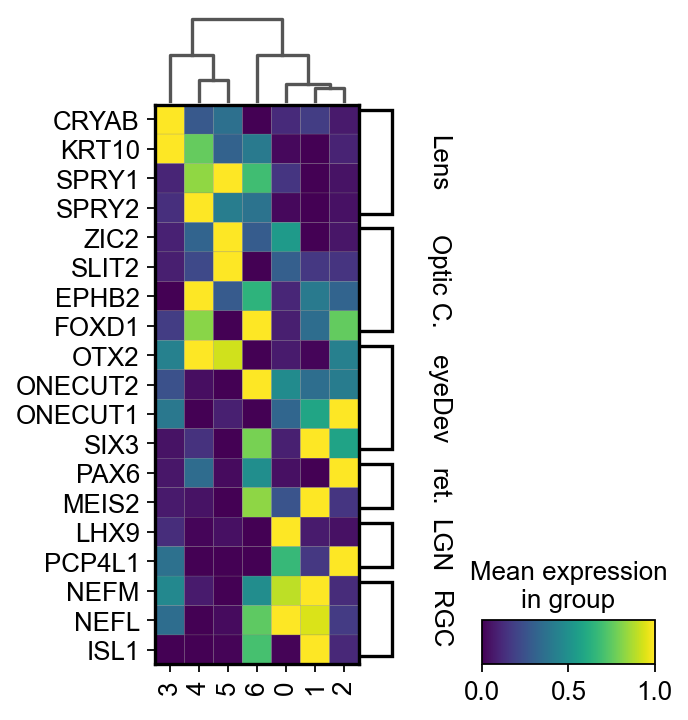

In [108]:

gs = sc.pl.matrixplot(optic, lens_marker_genes,
                      groupby='leiden',
                      dendrogram=True,
                      swap_axes=True,
                      standard_scale='var',
                      #var_group_rotation=90,
                      figsize=(4, 5)
                     )
